# Практическое задание по ММРО. ЕМ-алгоритм для разделения смеси распределений.

## Выполнила Голдобина Ольга, ВМК 317 гр.

В данном задании необходимо реализовать ЕМ-агоритм и применить его для определения фона в видео. В качестве данных используются последовательности Pedestrians и Traffic.

## 1. Реализация ЕМ-алгоритма.

In [1]:
import numpy as np
from skimage.io import imread
from scipy.special import logsumexp
import time
import matplotlib.pyplot as plt

In [2]:
class EM_algorithm:
    def __init__(self, diag=False, num_components=3, num_iter=20, num_tries=3):
        self.diag = diag
        self.num_components = num_components
        self.num_iter = num_iter
        self.num_tries = num_tries
        
    def fit(self, X):
        '''
        X - matrix N x D
        '''
        D = X.shape[1]
        max_ll = -np.inf

        for t in range(self.num_tries):
            w = np.random.randint(1,10,self.num_components)
            w = w / np.sum(w)
            mu = np.random.rand(self.num_components, D)
            if self.diag:
                sigma = np.ones((self.num_components, D))
            else:
                sigma = np.broadcast_to(np.eye(D), (self.num_components, D, D)).copy()

            centered_X = X[np.newaxis, :, :] - mu[:, np.newaxis, :] #KND

            LLs = []
            for i in range(self.num_iter):
                #E:
                if self.diag:
                    inv_sigma = 1 / sigma
                    log_P_X = (-0.5 * np.sum((centered_X ** 2) *
                            inv_sigma[:,np.newaxis,:], axis=2) - 
                            0.5 * (D * np.log(2 * np.pi) + 
                            np.log(np.prod(sigma, axis=1))[:, np.newaxis]))            
                else:
                    inv_sigma = np.linalg.inv(sigma) #KDD
                    log_P_X = (-0.5 * np.sum(np.matmul(centered_X, inv_sigma) * centered_X, axis=2) -
                            0.5 * (D * np.log(2 * np.pi) +
                            np.log(np.linalg.det(sigma)))[:, None])
                log_P_X_T = np.log(w)[:, np.newaxis] + log_P_X

                log_sum_exp = logsumexp(log_P_X_T, axis=0, keepdims=True)
                log_likelihood = log_sum_exp.sum()
                LLs += [log_likelihood]

                log_P_T = log_P_X_T - log_sum_exp
                P_T = np.exp(log_P_T)   ##KN

                #M:
                w = np.mean(P_T, axis=1)
                mu = np.dot(P_T, X) / np.sum(P_T, axis=1, keepdims=True)
                centered_X = X[np.newaxis, :, :] - mu[:, np.newaxis, :]
                if self.diag:
                    sigma = (np.sum((centered_X ** 2) * P_T[:,:,np.newaxis], axis=1) /
                    np.sum(P_T, axis=1)[:, np.newaxis] + 1e-3 * np.ones((self.num_components, D)))
                else:
                    for k in range(self.num_components):
                        sigma[k] = ((centered_X[k].T).dot(centered_X[k] * P_T[k][:, np.newaxis]) /
                                    P_T[k].sum() + 1e-3 * np.eye(D))
                        
            if log_likelihood > max_ll:
                max_ll = log_likelihood
                self.w = w
                self.mu = mu
                if self.diag:
                    sigma = np.apply_along_axis(np.diag, axis=1, arr=sigma)
                self.sigma = sigma
                self.log_likelihood = LLs
                self.P_T = P_T
                
    def predict_proba(self, X):
        '''
        X - matrix N x D
        '''
        centered_X = X[np.newaxis, :, :] - self.mu[:, np.newaxis, :]
        if self.diag:
            inv_sigma = 1 / self.sigma
            log_P_X = (-0.5 * np.sum((centered_X ** 2) *
                    inv_sigma[:,np.newaxis,:], axis=2) - 
                    0.5 * (X.shape[1] * np.log(2 * np.pi) + 
                    np.log(np.prod(self.sigma, axis=1))[:, np.newaxis]))            
        else:
            inv_sigma = np.linalg.inv(self.sigma) #KDD
            log_P_X = (-0.5 * np.sum(np.matmul(centered_X, inv_sigma) * centered_X, axis=2) -
                    0.5 * (X.shape[1] * np.log(2 * np.pi) +
                    np.log(np.linalg.det(self.sigma)))[:, None])
        log_P_X_T = np.log(self.w)[:, np.newaxis] + log_P_X
        log_sum_exp = logsumexp(log_P_X_T, axis=0)
        return log_sum_exp

Измерим время работы одной итерации

In [506]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=10 ** 4, n_features=100, cluster_std=1.0,
                  centers=10, shuffle=False, random_state=42)

em = EM_algorithm(num_components=10, num_iter=1, num_tries=1)
start_time = time.time()
em.fit(X)
end_time = time.time()
print(end_time - start_time)

0.19310784339904785


## 2. Тестирование ЕМ-алогоритма

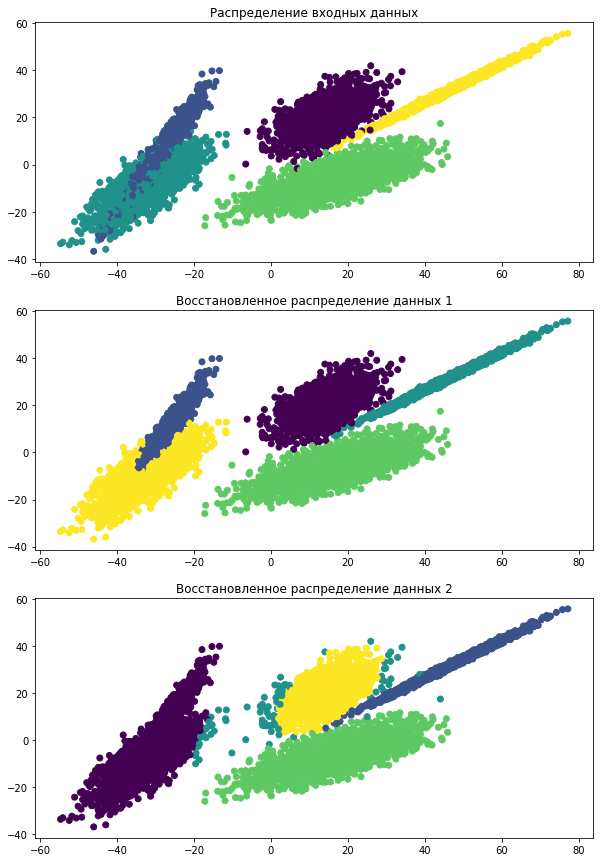

In [63]:
N = 10000
K = 5
D = 2

w = np.random.rand(K)
w /= w.sum()

mu = np.random.randint(-50, 50, (K, D))
sigma = np.random.randint(1, 10, (K, D, D))
sigma = sigma.astype(float)
sigma = np.matmul(sigma, np.transpose(sigma, axes=(0, 2, 1)))
sigma += (1e-3 * np.eye(D))[None, :, :]

X = np.empty((N, D))
y = np.empty(N)

for i in range(N):
    t = np.random.choice(range(K), p=w)
    y[i] = t
    X[i] = np.random.multivariate_normal(mu[t], sigma[t])

plt.figure(figsize=(10, 15))
plt.subplot(311)
plt.scatter(*X.T, c=y)
plt.title('Распределение входных данных')

plt.subplot(312)
em1 = EM_algorithm(num_components=K, num_tries=15, num_iter=10)
em1.fit(X)
plt.scatter(*X.T, c=np.argmax(em1.P_T, axis=0))
plt.title('Восстановленное распределение данных 1')

plt.subplot(313)
em2 = EM_algorithm(num_components=K, num_tries=15, num_iter=10)
em2.fit(X)
plt.scatter(*X.T, c=np.argmax(em2.P_T, axis=0))
plt.title('Восстановленное распределение данных 2')

plt.show()

Замечаем, что в первом случае распределение удалось восстановить достаточно точно, а во втором случае точность невелика. Это показвает, что работа ЕМ-алгоритма зависит от начального приближения.

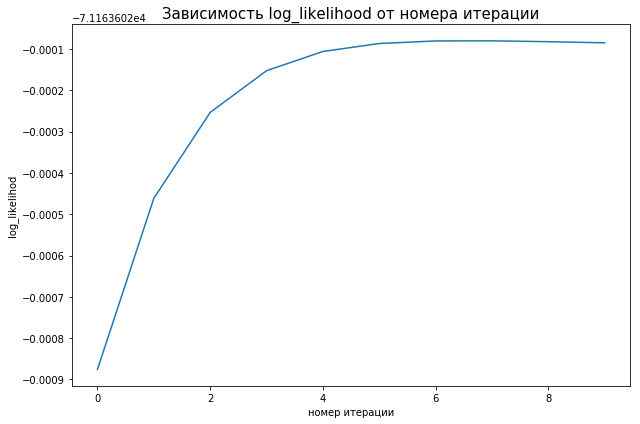

In [481]:
log_LL = em1.log_likelihood

plt.figure(figsize=(9,6))
plt.plot(range(len(log_LL)), log_LL)
plt.xlabel('номер итерации')
plt.ylabel('log_likelihod')
plt.title('Зависимость log_likelihood от номера итерации', fontsize=15)
plt.tight_layout()
plt.show()

На графике видно, что логарифм правдоподобия не убывает.

## 3. Оценка модели фона с помощью одномерной гауссианы.

In [3]:
from tqdm import tqdm, tqdm_notebook

In [48]:
class Background_Estimation:
    def __init__(self, **kwargs):
        self.kwargs = kwargs
        self.pixels_EM = None
        
    def fit(self, train_video):
        '''
        train_video - matrix T x N x D
        '''
        T, N, D = train_video.shape
        self.pixels_EM = np.empty((N, D), dtype=EM_algorithm)
        for n in tqdm_notebook(range(N), 'Background_Estimation.fit'):
            for d in range(D):
                em = EM_algorithm(**self.kwargs)
                em.fit(train_video[:, n, d][:, np.newaxis])
                self.pixels_EM[n,d] = em
                
    def predict(self, test_video, threshold=3):
        '''
        test_video, mask - matrix  T x N x D
        '''
        assert self.pixels_EM is not None, 'Not fitted yet'
        
        T, N, D = test_video.shape
        mask = np.empty((T, N, D))
        for n in range(N):
            for d in range(D):
                mu = self.pixels_EM[n,d].mu[0]
                sigma = self.pixels_EM[n,d].sigma[0][0]
                mask[:,n,d] = np.abs(test_video[:,n,d] - mu) >= threshold * np.sqrt(sigma)
        return mask
    
    def predict_fly(self, test_video, ro=0.1, threshold=3):
        assert self.pixels_EM is not None, 'Not fitted yet'
        
        T, N, D = test_video.shape
        mask = np.empty((T, N, D))
        
        for t in tqdm_notebook(range(T), 'predict_fly'):
            for n in range(N):
                for d in range(D):
                    mu = self.pixels_EM[n,d].mu[0]
                    sigma = self.pixels_EM[n,d].sigma[0][0]
                    res = np.abs(test_video[t,n,d] - mu) >= threshold * np.sqrt(sigma)
                    mask[t,n,d] = res
                    if not res:
                        bright = test_video[t,n,d]
                        new_nu = ro * bright + (1 - ro) * mu
                        self.pixels_EM[n,d].mu[0] = new_nu
                        new_sigma = (((bright - new_nu) ** 2) * ro +
                                                           (1 - ro) * sigma)
                        if new_sigma < 1e-3:
                            new_sigma = 1e-3
                        self.pixels_EM[n,d].sigma[0][0] = new_sigma
        return mask

Считаем данные pedestrians

In [54]:
import os

path_img = './pedestrians/input/'
path_masks = './pedestrians/groundtruth/'
imgs = []
masks = []

for r, d, f in os.walk(path_img):
    for file in f:
        if '.jpg' in file:
            imgs.append(os.path.join(r, file))
            
for r, d, f in os.walk(path_masks):
    for file in f:
        if '.png' in file:
            masks.append(os.path.join(r, file))
            
imgs.sort()
masks.sort()

In [55]:
im_gray = []
im = []
for im_name in imgs:
    im_gray.append(imread(im_name, as_gray=True))
    im.append(imread(im_name, as_gray=False))
    
mask = []
for mask_name in masks:
    mask.append(imread(mask_name, as_gray=True))

In [56]:
train_video = np.array(im[:299])
train_video_gray = np.array(im_gray[:299])
test_video_gray = np.array(im_gray[299:])
test_video = np.array(im[299:])
train_mask = np.array(mask[:299]).astype('bool')
test_mask = np.array(mask[299:]).astype('bool')

Обучим алгоритм

In [49]:
bg = Background_Estimation(num_components=1, num_iter=1, num_tries=5)
bg.fit(train_video_gray)

Предскажем маски

In [50]:
mask = bg.predict(test_video_gray).astype('bool')

Оценим качество визуально

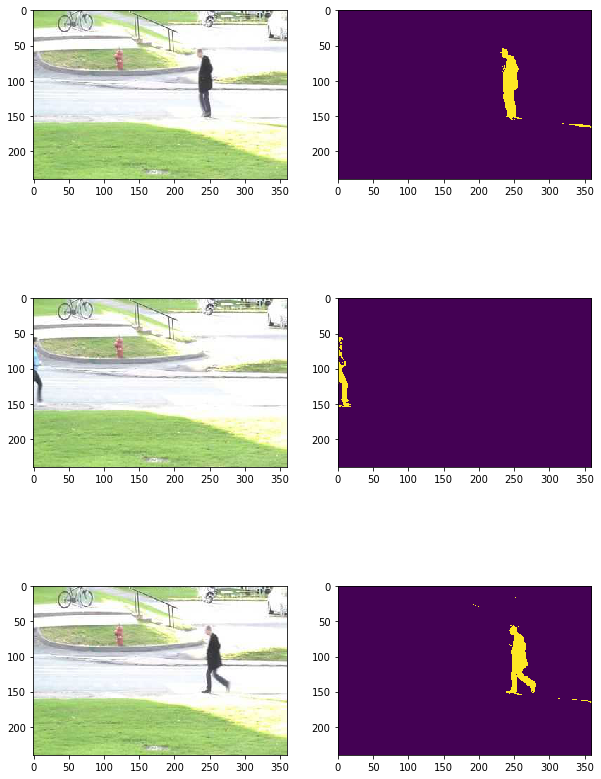

In [111]:
ind = np.random.randint(0, test_video.shape[0], 3)
fig, axs = plt.subplots(3, 2, figsize=(10,15))
i = 0
for axes in axs:
    axes[0].imshow(test_video[ind[i]])
    axes[1].imshow(mask[ind[i]])
    i += 1

Посчитаем FN и FP

In [25]:
FP = np.empty(mask.shape[0], dtype=int)
FN = np.empty(mask.shape[0], dtype=int)
for i in range(mask.shape[0]):
    FP[i] = (mask[i] & (~test_mask[i])).sum()
    FN[i] = (~mask[i] & test_mask[i]).sum()

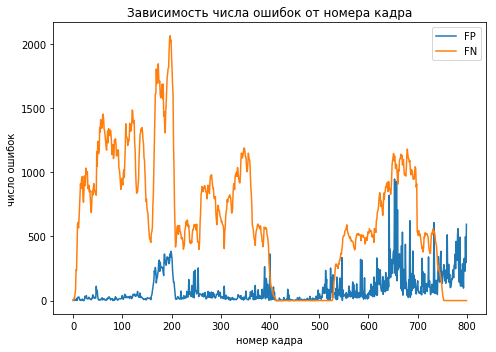

In [26]:
plt.figure(figsize=(7,5))

plt.plot(range(len(FP)), FP, label='FP')
plt.plot(range(len(FN)), FN, label='FN')
plt.title('Зависимость числа ошибок от номера кадра')
plt.xlabel('номер кадра')
plt.ylabel('число ошибок')
plt.legend()

plt.tight_layout()
plt.show()

Посчитаем ROC-AUC для нескольких фреймов

In [4]:
from sklearn.metrics import roc_curve, roc_auc_score

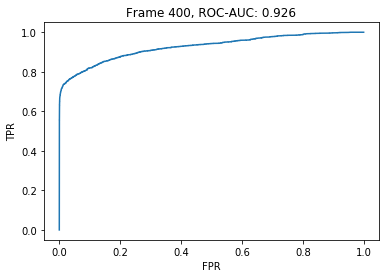

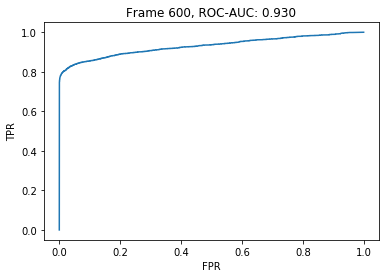

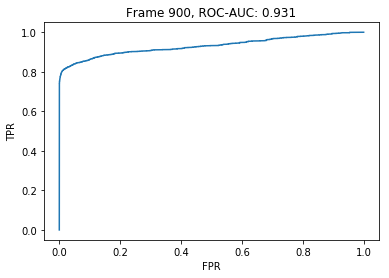

In [138]:
ind = [100, 300, 600]
for pic in ind:
    results = []
    for i in range(test_video.shape[1]):
        for j in range(test_video.shape[2]):
            mean = bg.pixels_EM[i, j].mu[0, 0]
            cov = bg.pixels_EM[i, j].sigma[0, 0]
            res = np.abs(test_video_gray[pic, i, j] - mean) / (cov ** 0.5)
            results += [res]

    plt.figure()
    fpr, tpr, thresholds = roc_curve(test_mask[pic].ravel(), results)
    roc_auc = roc_auc_score(test_mask[pic].ravel(), results)
    plt.plot(fpr, tpr)
    plt.title(f'Frame {pic+300}, ROC-AUC: {roc_auc:0.3f}')
    plt.xlabel('FPR')
    plt.ylabel('TPR')

## 4. Оценка модели фона на основе адаптивной одномерной гауссианы.

будем использовать тот же класс Background_Estimation

In [57]:
bg_fly = Background_Estimation(num_components=1, num_iter=1, num_tries=3)
bg_fly.fit(train_video_gray)

так как для предсказания требуется много времени, найдем маски для части тестового видео

In [58]:
mask_fly = bg_fly.predict_fly(test_video_gray[:300,:,:]).astype('bool')

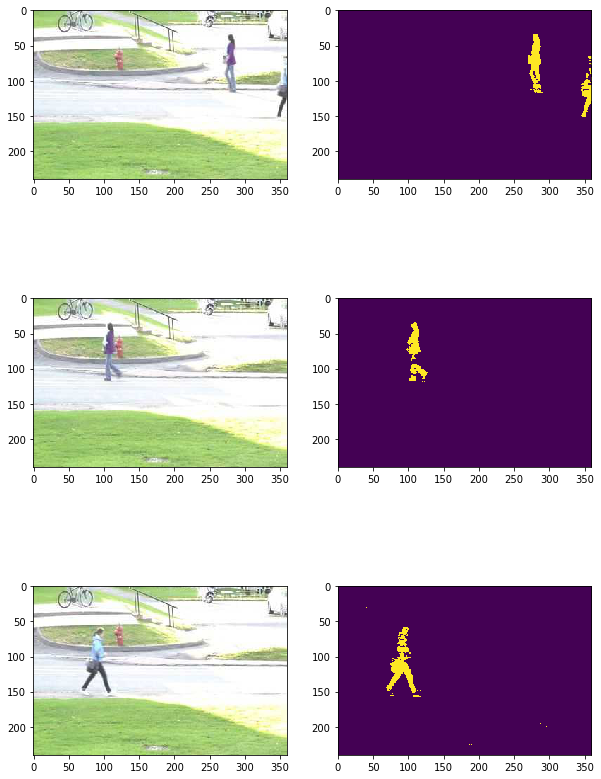

In [29]:
ind = np.random.randint(0, 300, 3)
fig, axs = plt.subplots(3, 2, figsize=(10,15))
i = 0
for axes in axs:
    axes[0].imshow(test_video[ind[i]])
    axes[1].imshow(mask_fly[ind[i]])
    i += 1

In [30]:
FP = np.empty(mask_fly.shape[0], dtype=int)
FN = np.empty(mask_fly.shape[0], dtype=int)
for i in range(mask_fly.shape[0]):
    FP[i] = (mask_fly[i] & (~test_mask[i])).sum()
    FN[i] = (~mask_fly[i] & test_mask[i]).sum()

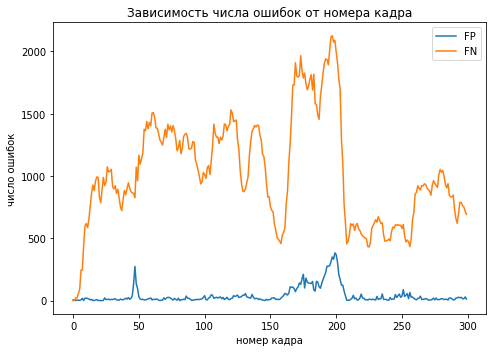

In [31]:
plt.figure(figsize=(7,5))

plt.plot(range(len(FP)), FP, label='FP')
plt.plot(range(len(FN)), FN, label='FN')
plt.title('Зависимость числа ошибок от номера кадра')
plt.xlabel('номер кадра')
plt.ylabel('число ошибок')
plt.legend()

plt.tight_layout()
plt.show()

Видно, что количесво ошибок 1-го рода значительно уменьшилось. Однако такой алгоритм очень затратный по времени.

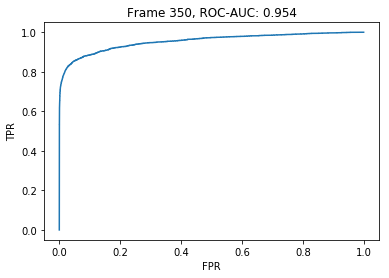

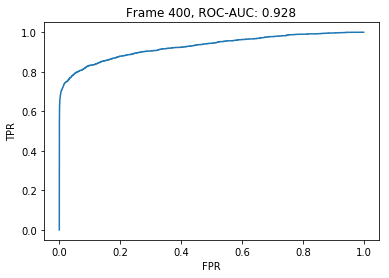

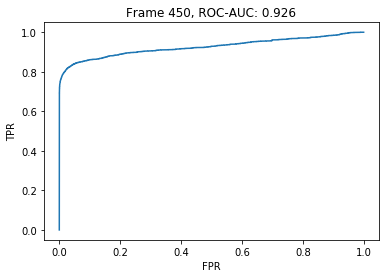

In [24]:
ind = [50, 100, 150]
for pic in ind:
    results = []
    for i in range(test_video.shape[1]):
        for j in range(test_video.shape[2]):
            mean = bg_fly.pixels_EM[i, j].mu[0, 0]
            cov = bg_fly.pixels_EM[i, j].sigma[0, 0]
            res = np.abs(test_video_gray[pic, i, j] - mean) / (cov ** 0.5)
            results += [res]

    plt.figure()
    fpr, tpr, thresholds = roc_curve(test_mask[pic].ravel(), results)
    roc_auc = roc_auc_score(test_mask[pic].ravel(), results)
    plt.plot(fpr, tpr)
    plt.title(f'Frame {pic+300}, ROC-AUC: {roc_auc:0.3f}')
    plt.xlabel('FPR')
    plt.ylabel('TPR')

In [41]:
import JSAnimation
from JSAnimation.IPython_display import display_animation
import visualization as vi


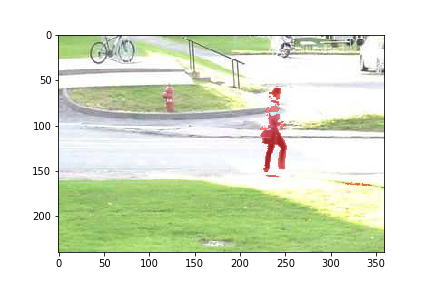
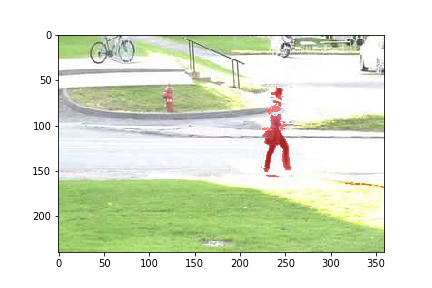
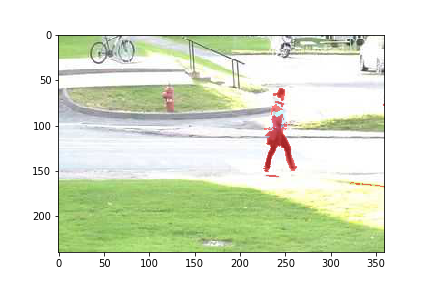
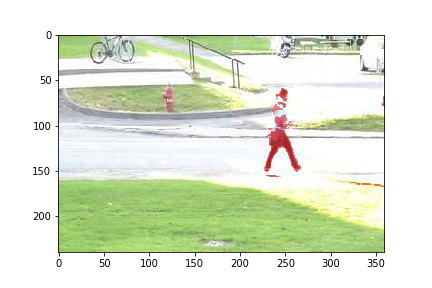
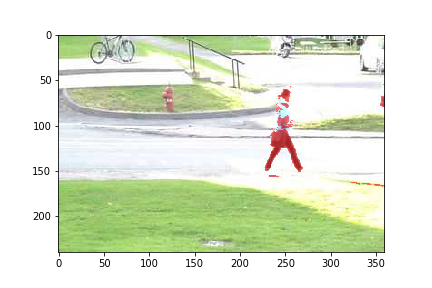
...
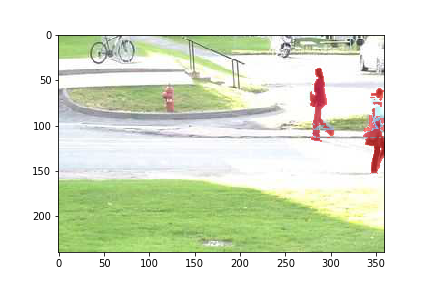
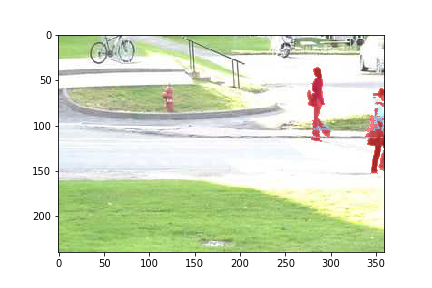
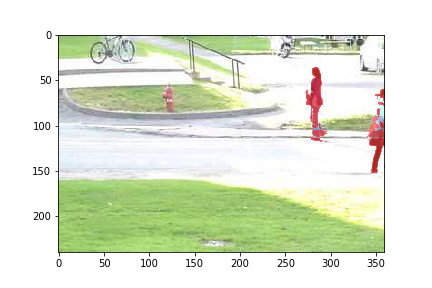
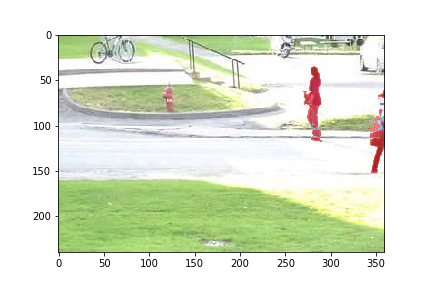
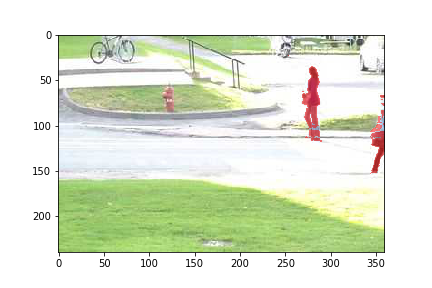

In [60]:
video = vi.make_video(test_video[100:150].astype(float), mask_fly[100:150])
video()

## 5. Оценка модели фона с помощью многомерой гауссианы.

In [13]:
class Background_Estimation_rgb:
    def __init__(self, **kwargs):
        self.kwargs = kwargs
        self.pixels_EM = None
        
    def fit(self, train_video):
        '''
        train_video - matrix T x N x D x 3
        '''
        T, N, D, K = train_video.shape
        self.pixels_EM = np.empty((N, D), dtype=EM_algorithm)
        for n in tqdm_notebook(range(N), 'Background_Estimation.fit'):
            for d in range(D):
                em = EM_algorithm(**self.kwargs)
                em.fit(train_video[:, n, d, :])
                self.pixels_EM[n,d] = em
                
    def predict(self, test_video, threshold=3):
        '''
        test_video, mask - matrix  T x N x D x 3
        '''
        assert self.pixels_EM is not None, 'Not fitted yet'
        
        T, N, D, K = test_video.shape
        mask = np.empty((T, N, D))
        for n in range(N):
            for d in range(D):
                mask[:,n,d] = self.pixels_EM[n,d].predict_proba(test_video[:,n,d,:]) < threshold
        return mask

In [8]:
bg_rgb = Background_Estimation_rgb(num_components=1, num_iter=10, num_tries=1)
bg_rgb.fit(train_video)

In [9]:
mask_rgb = bg_rgb.predict(test_video, -70).astype('bool')

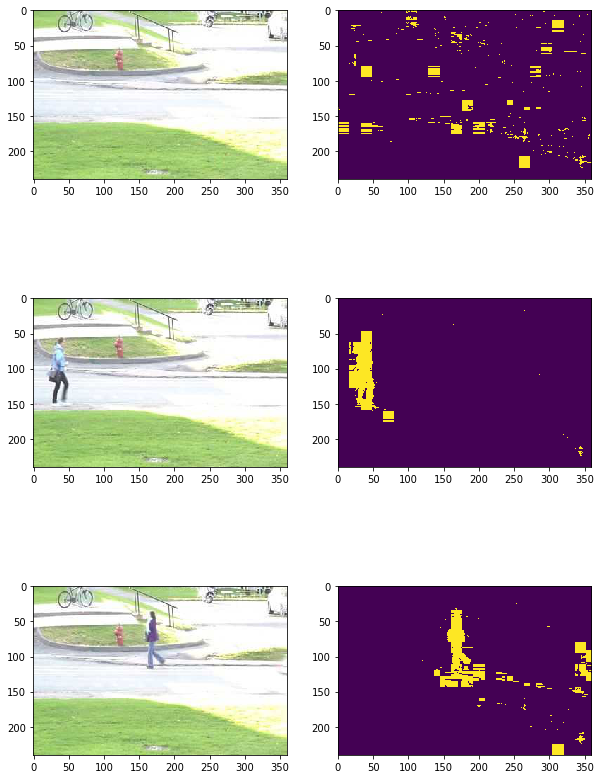

In [46]:
ind = np.random.randint(0, test_video.shape[0], 3)
fig, axs = plt.subplots(3, 2, figsize=(10,15))
i = 0
for axes in axs:
    axes[0].imshow(test_video[ind[i]])
    axes[1].imshow(mask_rgb[ind[i]])
    i += 1

In [10]:
FP = np.empty(mask_rgb.shape[0], dtype=int)
FN = np.empty(mask_rgb.shape[0], dtype=int)
for i in range(mask_rgb.shape[0]):
    FP[i] = (mask_rgb[i] & (~test_mask[i])).sum()
    FN[i] = (~mask_rgb[i] & test_mask[i]).sum()

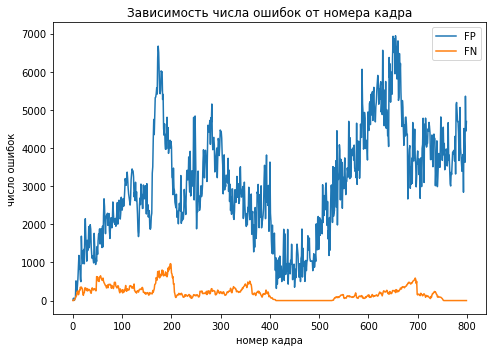

In [11]:
plt.figure(figsize=(7,5))

plt.plot(range(len(FP)), FP, label='FP')
plt.plot(range(len(FN)), FN, label='FN')
plt.title('Зависимость числа ошибок от номера кадра')
plt.xlabel('номер кадра')
plt.ylabel('число ошибок')
plt.legend()

plt.tight_layout()
plt.show()

Очень много ошибок 1 рода.

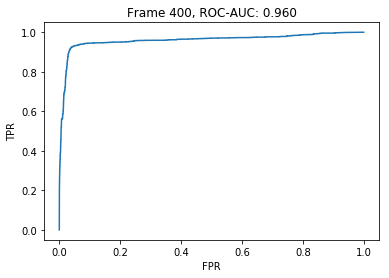

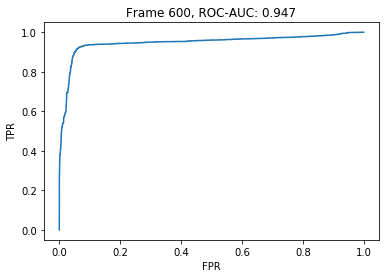

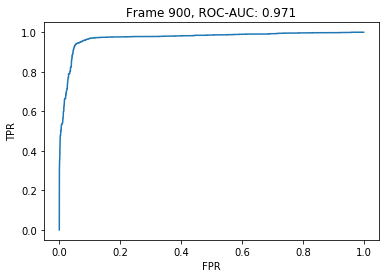

In [30]:
ind = [100, 300, 600]
for pic in ind:
    results = []
    for i in range(test_video.shape[1]):
        for j in range(test_video.shape[2]):
            res = -bg_rgb.pixels_EM[i,j].predict_proba(test_video[:,i,j,:])[pic]
            results += [res]

    plt.figure()
    fpr, tpr, thresholds = roc_curve(test_mask[pic].ravel(), results)
    roc_auc = roc_auc_score(test_mask[pic].ravel(), results)
    plt.plot(fpr, tpr)
    plt.title(f'Frame {pic+300}, ROC-AUC: {roc_auc:0.3f}')
    plt.xlabel('FPR')
    plt.ylabel('TPR')

Переведем изображение из RGB в HSV применим трёхмерную гауссиану

In [10]:
from matplotlib.colors import rgb_to_hsv

In [13]:
train_video_hsv = np.empty_like(train_video, dtype=float)
test_video_hsv = np.empty_like(test_video, dtype=float)
for i in range(train_video.shape[0]):
    train_video_hsv[i] = rgb_to_hsv(train_video[i])
for i in range(test_video.shape[0]):
    test_video_hsv[i] = rgb_to_hsv(test_video[i])

In [14]:
bg_hsv = Background_Estimation_rgb(num_components=1, num_iter=10, num_tries=1)
bg_hsv.fit(train_video_hsv)

In [15]:
mask_hsv = bg_hsv.predict(test_video_hsv, -70).astype(bool)

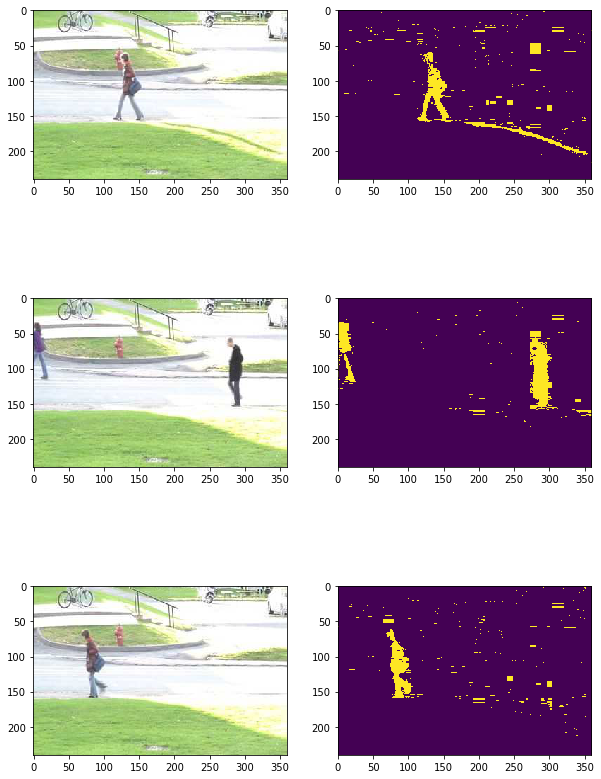

In [21]:
ind = np.random.randint(0, test_video.shape[0], 3)
fig, axs = plt.subplots(3, 2, figsize=(10,15))
i = 0
for axes in axs:
    axes[0].imshow(test_video[ind[i]])
    axes[1].imshow(mask_hsv[ind[i]])
    i += 1

In [16]:
FP = np.empty(mask_hsv.shape[0], dtype=int)
FN = np.empty(mask_hsv.shape[0], dtype=int)
for i in range(mask_hsv.shape[0]):
    FP[i] = (mask_hsv[i] & (~test_mask[i])).sum()
    FN[i] = (~mask_hsv[i] & test_mask[i]).sum()

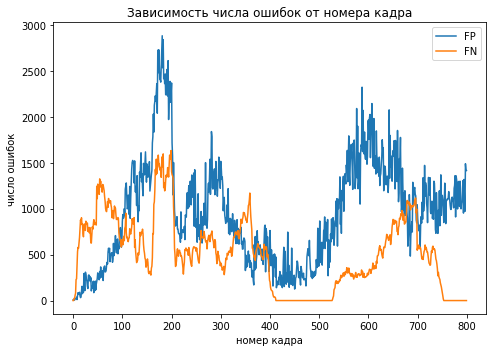

In [17]:
plt.figure(figsize=(7,5))

plt.plot(range(len(FP)), FP, label='FP')
plt.plot(range(len(FN)), FN, label='FN')
plt.title('Зависимость числа ошибок от номера кадра')
plt.xlabel('номер кадра')
plt.ylabel('число ошибок')
plt.legend()

plt.tight_layout()
plt.show()

Количество ошибок 1-го рода уменьшилось в 2 раза.

## 6. Разделение смеси 3 трёхмерных гауссиан

Считаем данные Traffic

In [5]:
import os

path_img = './traffic/input/'
path_masks = './traffic/groundtruth/'
imgs = []
masks = []

for r, d, f in os.walk(path_img):
    for file in f:
        if '.jpg' in file:
            imgs.append(os.path.join(r, file))
            
for r, d, f in os.walk(path_masks):
    for file in f:
        if '.png' in file:
            masks.append(os.path.join(r, file))
            
imgs.sort()
masks.sort()

In [6]:
im_gray = []
im = []
for im_name in imgs:
    im_gray.append(imread(im_name, as_gray=True))
    im.append(imread(im_name, as_gray=False))
    
mask = []
for mask_name in masks:
    mask.append(imread(mask_name, as_gray=True))

In [8]:
train_video = np.array(im[581:723])
test_video = np.array(im[1000:1570])
train_mask = np.array(mask[581:723]).astype('bool')
test_mask = np.array(mask[1000:1570]).astype('bool')

Судя по качеству, лучше взять hsv. 

In [11]:
train_video_hsv = np.empty_like(train_video, dtype=float)
test_video_hsv = np.empty_like(test_video, dtype=float)
for i in range(train_video.shape[0]):
    train_video_hsv[i] = rgb_to_hsv(train_video[i])
for i in range(test_video.shape[0]):
    test_video_hsv[i] = rgb_to_hsv(test_video[i])

Применим 3 трёхмерных гауссианы для распознавания фона.

In [14]:
bg_hsv = Background_Estimation_rgb(num_components=3, num_iter=10, num_tries=1)
bg_hsv.fit(train_video_hsv)

In [31]:
mask_hsv = bg_hsv.predict(test_video_hsv, -50).astype(bool)

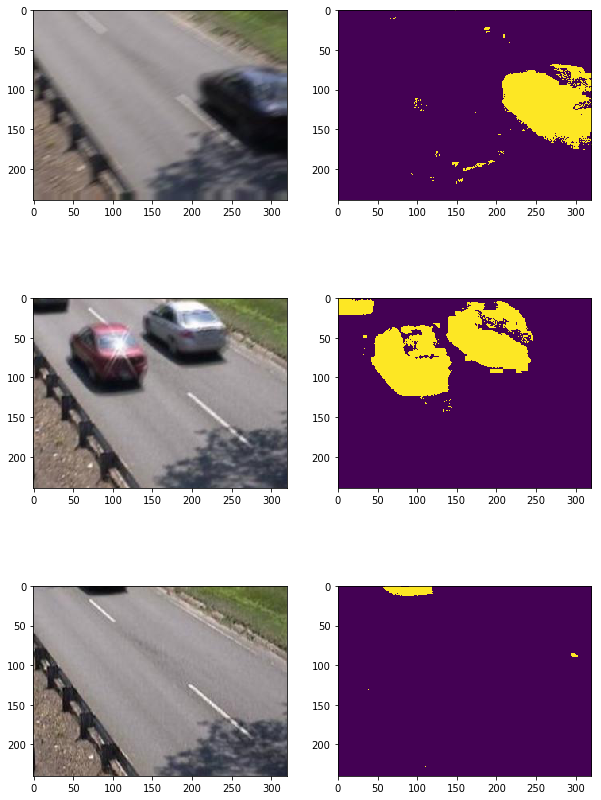

In [35]:
ind = np.random.randint(0, test_video.shape[0], 3)
fig, axs = plt.subplots(3, 2, figsize=(10,15))
i = 0
for axes in axs:
    axes[0].imshow(test_video[ind[i]])
    axes[1].imshow(mask_hsv[ind[i]])
    i += 1

In [33]:
FP = np.empty(mask_hsv.shape[0], dtype=int)
FN = np.empty(mask_hsv.shape[0], dtype=int)
for i in range(mask_hsv.shape[0]):
    FP[i] = (mask_hsv[i] & (~test_mask[i])).sum()
    FN[i] = (~mask_hsv[i] & test_mask[i]).sum()

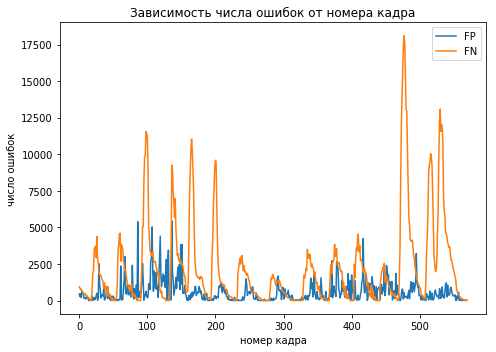

In [34]:
plt.figure(figsize=(7,5))

plt.plot(range(len(FP)), FP, label='FP')
plt.plot(range(len(FN)), FN, label='FN')
plt.title('Зависимость числа ошибок от номера кадра')
plt.xlabel('номер кадра')
plt.ylabel('число ошибок')
plt.legend()

plt.tight_layout()
plt.show()

In [41]:
import JSAnimation
from JSAnimation.IPython_display import display_animation
import visualization as vi


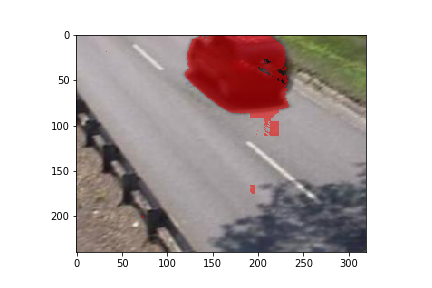
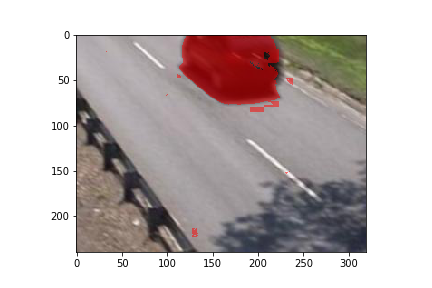
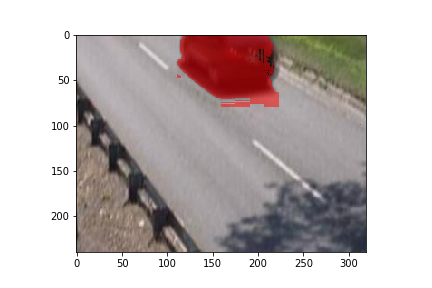
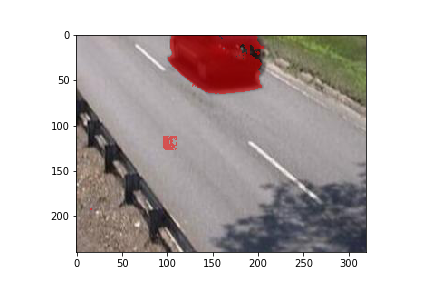
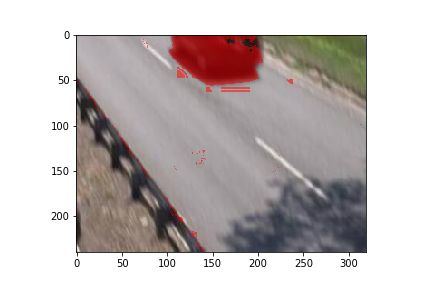
...
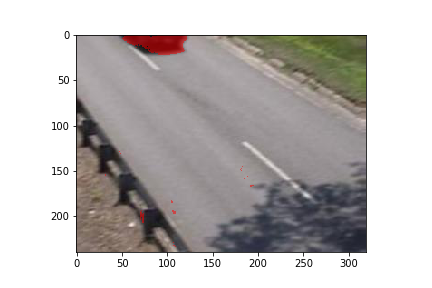
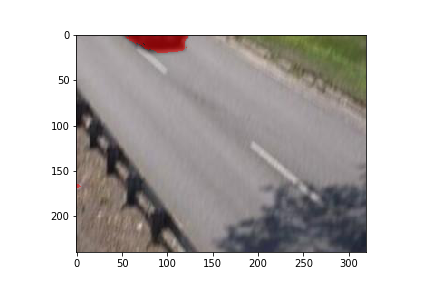
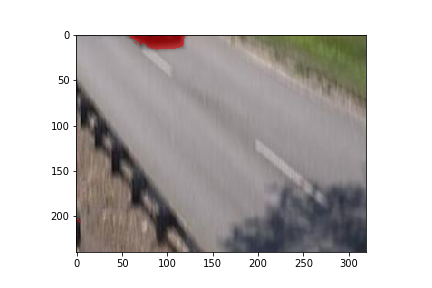
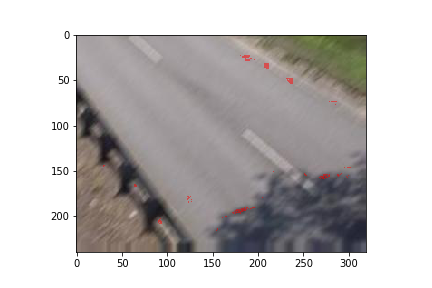
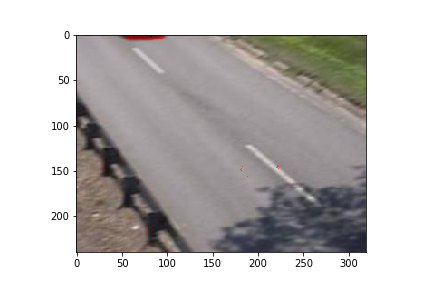

In [46]:
video = vi.make_video(test_video[:50].astype(float), mask_hsv[:50])
video()

Получились неплохие результаты. Количесто ложных срабатываний невелико.